---
Intensive MLR : Give me a sign!
---
---

1. Purpose:
To build and evaluate models (ANN and CNN) for classifying sign language gestures using the provided sign_mnist_train and sign_mnist_test datasets.

2. Key Questions:

- Descriptive Analysis:

- Inferential Analysis:
Is there any statistical relationship between features and the target variable?

- Modeling:
Can we design and evaluate ANN and CNN models for accurate gesture classification?
How do these models perform on the test dataset in terms of metrics like accuracy and F1-score?

```markdown
### Descriptive Analysis
- What is the distribution of each feature in the dataset?
- Are there any missing values or outliers in the dataset?
- What are the summary statistics (mean, median, standard deviation) of the features?

### Inferential Analysis
- Is there a significant difference in feature distributions between different classes?
- Are there any correlations between features and the target variable?
- Can we identify any patterns or trends in the data that could help in classification?
```

In [5]:
# Standard Data Science Toolkit
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Iteration Tools
import itertools

# Warning Ignorance for Redundant Warnings
import warnings
warnings.filterwarnings("ignore")

# Data Preprocessing and Verification Modules
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

## Data Load

In [ ]:

# Load the datasets
train_data_path = '/sign_mnist_train.csv'
test_data_path = '/sign_mnist_test.csv'

train_data = pd.read_csv(train_data_path)
test_data = pd.read_csv(test_data_path)

# Display initial information about the datasets
train_data_info = train_data.info()
test_data_info = test_data.info()

train_data_head = train_data.head()
test_data_head = test_data.head()

(train_data_info, train_data_head, test_data_info, test_data_head)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27455 entries, 0 to 27454
Columns: 785 entries, label to pixel784
dtypes: int64(785)
memory usage: 164.4 MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7172 entries, 0 to 7171
Columns: 785 entries, label to pixel784
dtypes: int64(785)
memory usage: 43.0 MB


(None,
    label  pixel1  pixel2  pixel3  pixel4  pixel5  pixel6  pixel7  pixel8  \
 0      3     107     118     127     134     139     143     146     150   
 1      6     155     157     156     156     156     157     156     158   
 2      2     187     188     188     187     187     186     187     188   
 3      2     211     211     212     212     211     210     211     210   
 4     13     164     167     170     172     176     179     180     184   
 
    pixel9  ...  pixel775  pixel776  pixel777  pixel778  pixel779  pixel780  \
 0     153  ...       207       207       207       207       206       206   
 1     158  ...        69       149       128        87        94       163   
 2     187  ...       202       201       200       199       198       199   
 3     210  ...       235       234       233       231       230       226   
 4     185  ...        92       105       105       108       133       163   
 
    pixel781  pixel782  pixel783  pixel784  
 0      

In [ ]:
train_data.describe()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
count,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,...,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000
mean,12.318813,145.419377,148.500273,151.247714,153.546531,156.210891,158.411255,160.472154,162.339683,163.954799,...,141.104863,147.495611,153.325806,159.125332,161.969259,162.736696,162.906137,161.966454,161.137898,159.824731
std,7.287552,41.358555,39.942152,39.056286,38.595247,37.111165,36.125579,35.016392,33.661998,32.651607,...,63.751194,65.512894,64.427412,63.708507,63.738316,63.444008,63.509210,63.298721,63.610415,64.396846
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.000000,121.000000,126.000000,130.000000,133.000000,137.000000,140.000000,142.000000,144.000000,146.000000,...,92.000000,96.000000,103.000000,112.000000,120.000000,125.000000,128.000000,128.000000,128.000000,125.500000
50%,13.000000,150.000000,153.000000,156.000000,158.000000,160.000000,162.000000,164.000000,165.000000,166.000000,...,144.000000,162.000000,172.000000,180.000000,183.000000,184.000000,184.000000,182.000000,182.000000,182.000000
75%,19.000000,174.000000,176.000000,178.000000,179.000000,181.000000,182.000000,183.000000,184.000000,185.000000,...,196.000000,202.000000,205.000000,207.000000,208.000000,207.000000,207.000000,206.000000,204.000000,204.000000
max,24.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000


In [ ]:
test_data.describe()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
count,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,...,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000
mean,11.247351,147.532627,150.445761,153.324317,155.663413,158.169688,160.790853,162.282766,163.649191,165.589515,...,138.546570,145.539598,150.744980,155.638873,158.893196,159.648494,158.162019,157.672755,156.664250,154.776771
std,7.446712,43.593144,41.867838,40.442728,39.354776,37.749637,36.090916,36.212636,35.885378,33.721876,...,64.501665,65.132370,65.760539,65.565147,65.200300,65.499368,66.493576,66.009690,67.202939,68.285148
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,122.000000,126.000000,130.000000,134.000000,137.000000,141.000000,144.000000,145.000000,147.000000,...,90.000000,95.000000,99.000000,105.000000,113.000000,113.750000,113.000000,115.000000,111.000000,106.750000
50%,11.000000,154.000000,157.000000,159.000000,161.000000,163.000000,165.000000,166.000000,168.000000,169.000000,...,137.000000,155.000000,168.000000,177.000000,181.000000,182.000000,181.000000,180.000000,180.000000,179.000000
75%,18.000000,178.000000,179.000000,181.000000,182.000000,184.000000,185.000000,186.000000,187.000000,187.000000,...,195.000000,200.000000,204.250000,207.000000,207.000000,208.000000,207.000000,205.000000,206.000000,204.000000
max,24.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000


In [ ]:
# Check for missing values in both datasets
train_data.isnull().sum()
test_data.isnull().sum()


,0
label,0
pixel1,0
pixel2,0
pixel3,0
pixel4,0
...,...
pixel780,0
pixel781,0
pixel782,0
pixel783,0


There is no null values

In [ ]:
# Normalize pixel values to range [0, 1]
train_data.iloc[:, 1:] = train_data.iloc[:, 1:] / 255.0
test_data.iloc[:, 1:] = test_data.iloc[:, 1:] / 255.0


In [ ]:
# Verify normalization
train_data.describe()
test_data.describe()


,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
count,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,...,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000
mean,11.247351,0.578559,0.589983,0.601272,0.610445,0.620273,0.630552,0.636403,0.641762,0.649371,...,0.543320,0.570744,0.591157,0.610349,0.623111,0.626073,0.620243,0.618325,0.614370,0.606968
std,7.446712,0.170954,0.164188,0.158599,0.154332,0.148038,0.141533,0.142010,0.140727,0.132243,...,0.252948,0.255421,0.257884,0.257118,0.255687,0.256860,0.260759,0.258862,0.263541,0.267785
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.039216,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,0.478431,0.494118,0.509804,0.525490,0.537255,0.552941,0.564706,0.568627,0.576471,...,0.352941,0.372549,0.388235,0.411765,0.443137,0.446078,0.443137,0.450980,0.435294,0.418627
50%,11.000000,0.603922,0.615686,0.623529,0.631373,0.639216,0.647059,0.650980,0.658824,0.662745,...,0.537255,0.607843,0.658824,0.694118,0.709804,0.713725,0.709804,0.705882,0.705882,0.701961
75%,18.000000,0.698039,0.701961,0.709804,0.713725,0.721569,0.725490,0.729412,0.733333,0.733333,...,0.764706,0.784314,0.800980,0.811765,0.811765,0.815686,0.811765,0.803922,0.807843,0.800000
max,24.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Descriptive Analysis

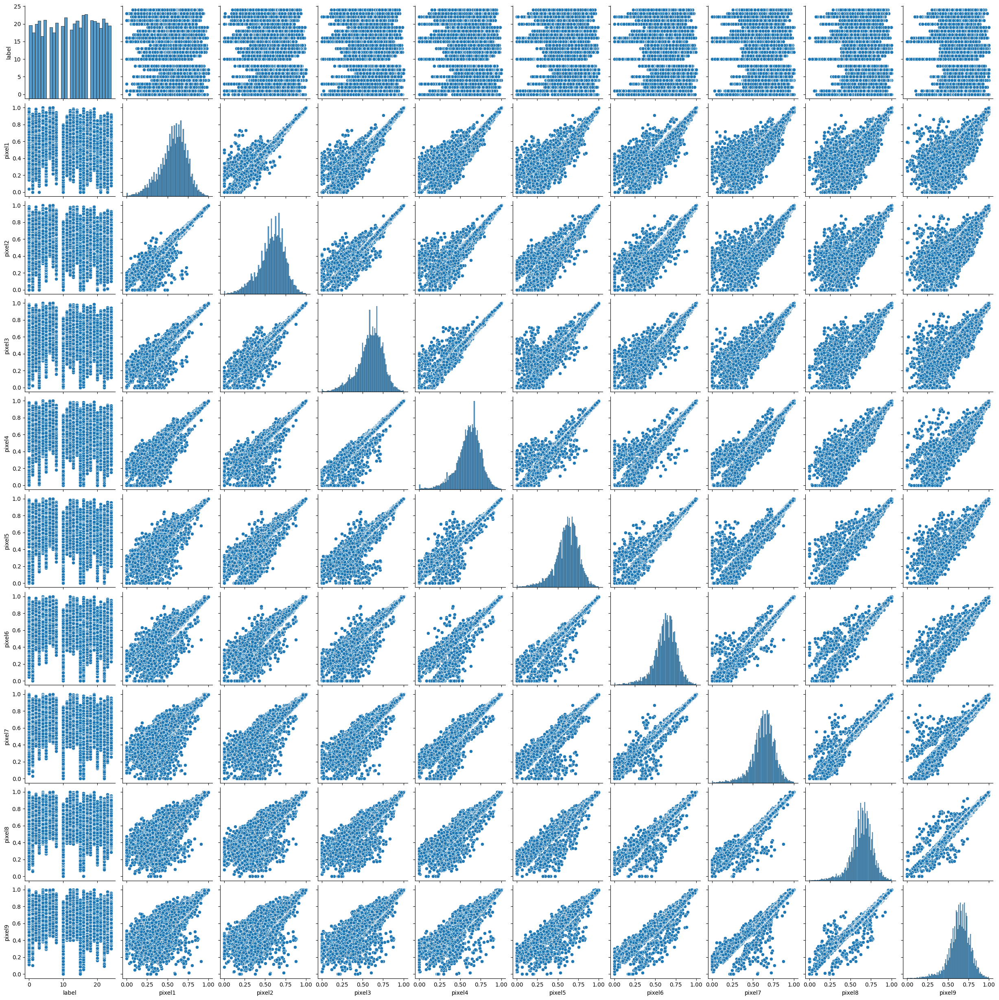

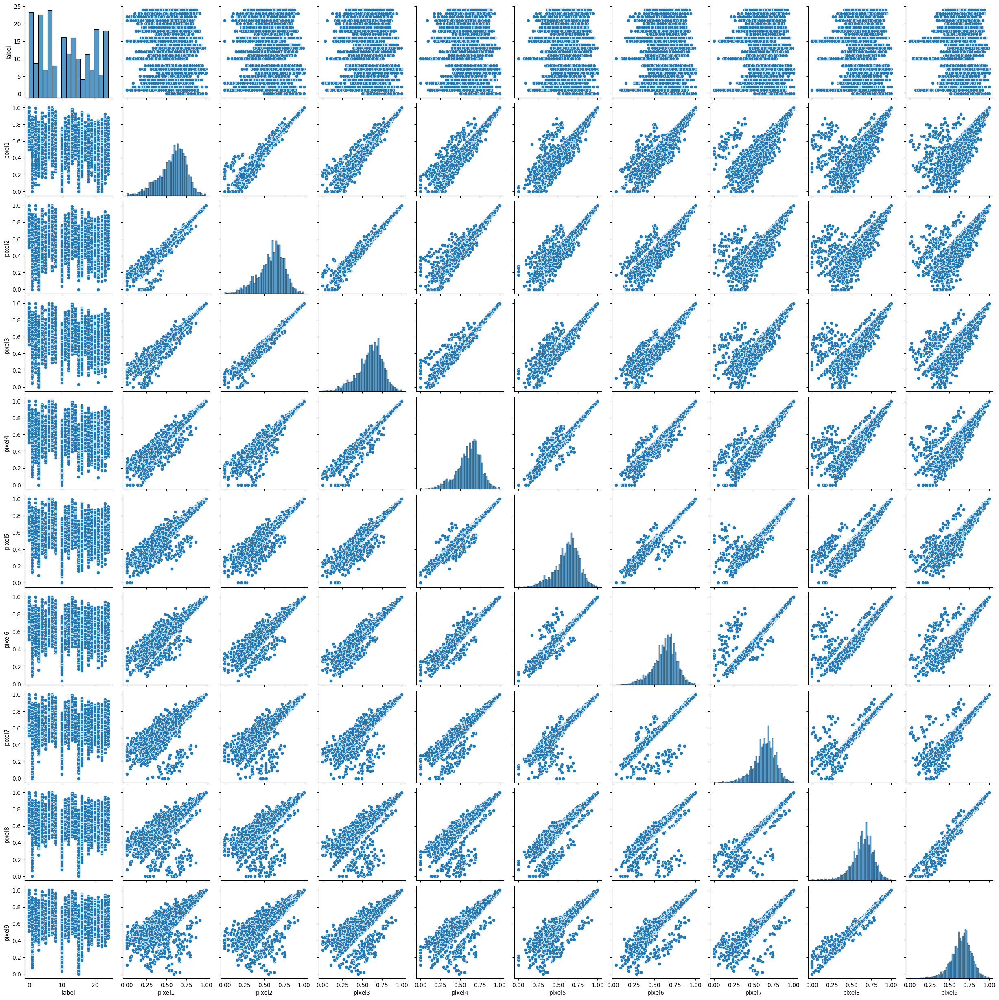

In [ ]:
# Create a pairplot for the training data
sns.pairplot(train_data.iloc[:, :10])  # Adjust the range of columns as needed
plt.show()

# Create a pairplot for the test data
sns.pairplot(test_data.iloc[:, :10])  # Adjust the range of columns as needed
plt.show()

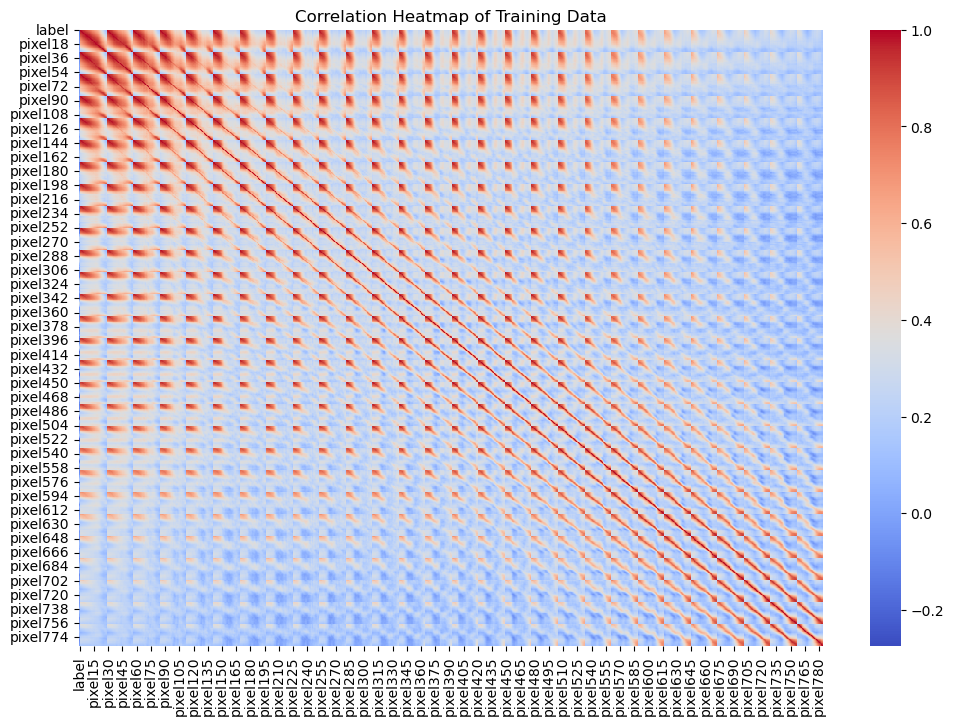

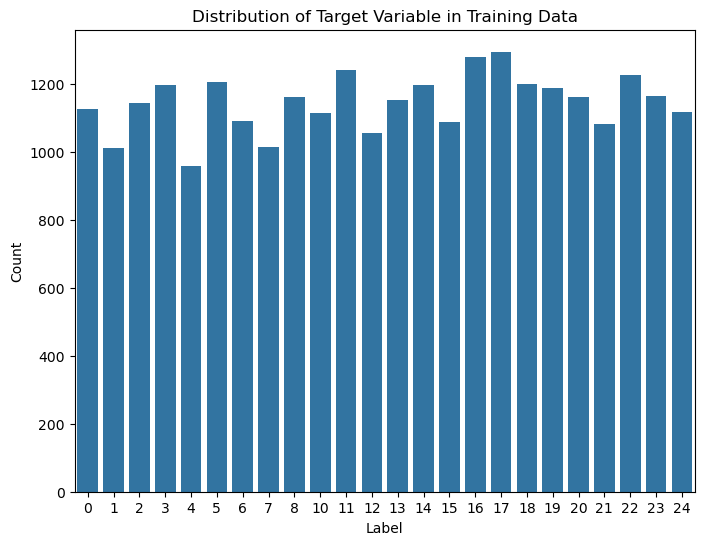

In [ ]:
# Plot the correlation heatmap for the training data
plt.figure(figsize=(12, 8))
correlation_matrix = train_data.corr()
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Heatmap of Training Data')
plt.show()

# Plot the distribution of the target variable in the training data
plt.figure(figsize=(8, 6))
sns.countplot(x='label', data=train_data)
plt.title('Distribution of Target Variable in Training Data')
plt.xlabel('Label')
plt.ylabel('Count')
plt.show()

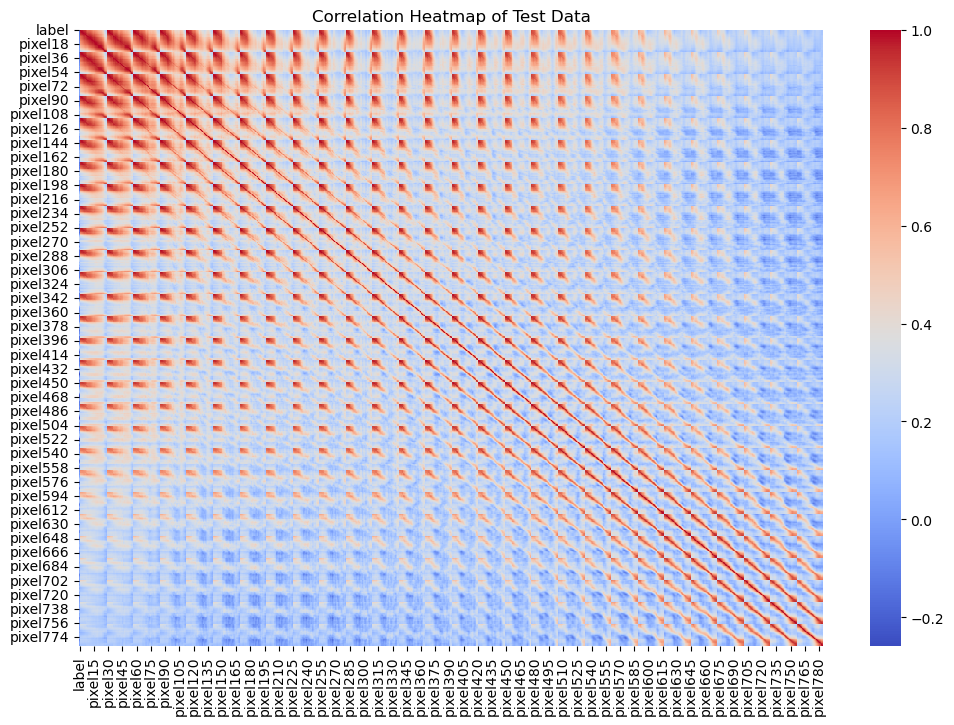

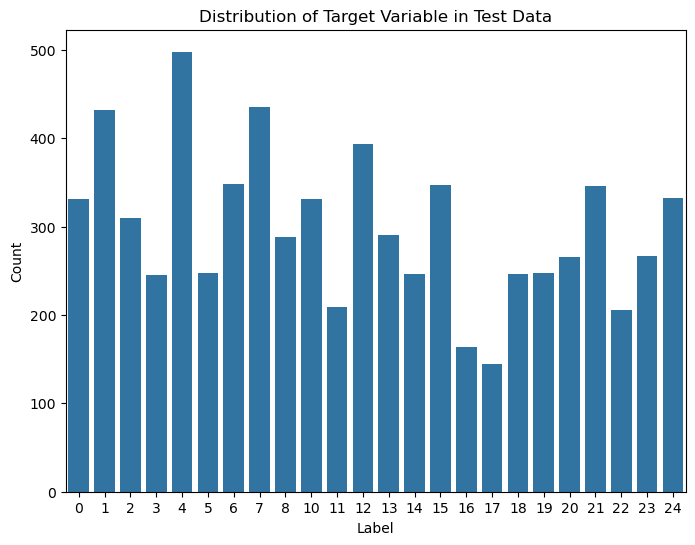

In [ ]:
# Plot the correlation heatmap for the test data
plt.figure(figsize=(12, 8))
correlation_matrix_test = test_data.corr()
sns.heatmap(correlation_matrix_test, annot=False, cmap='coolwarm')
plt.title('Correlation Heatmap of Test Data')
plt.show()

# Plot the distribution of the target variable in the test data
plt.figure(figsize=(8, 6))
sns.countplot(x='label', data=test_data)
plt.title('Distribution of Target Variable in Test Data')
plt.xlabel('Label')
plt.ylabel('Count')
plt.show()

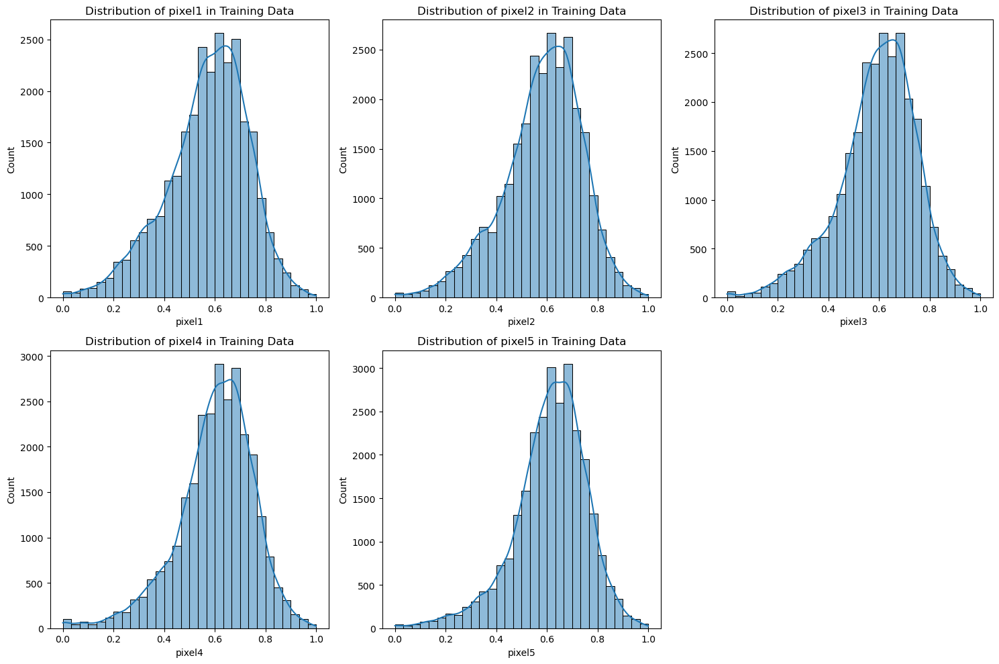

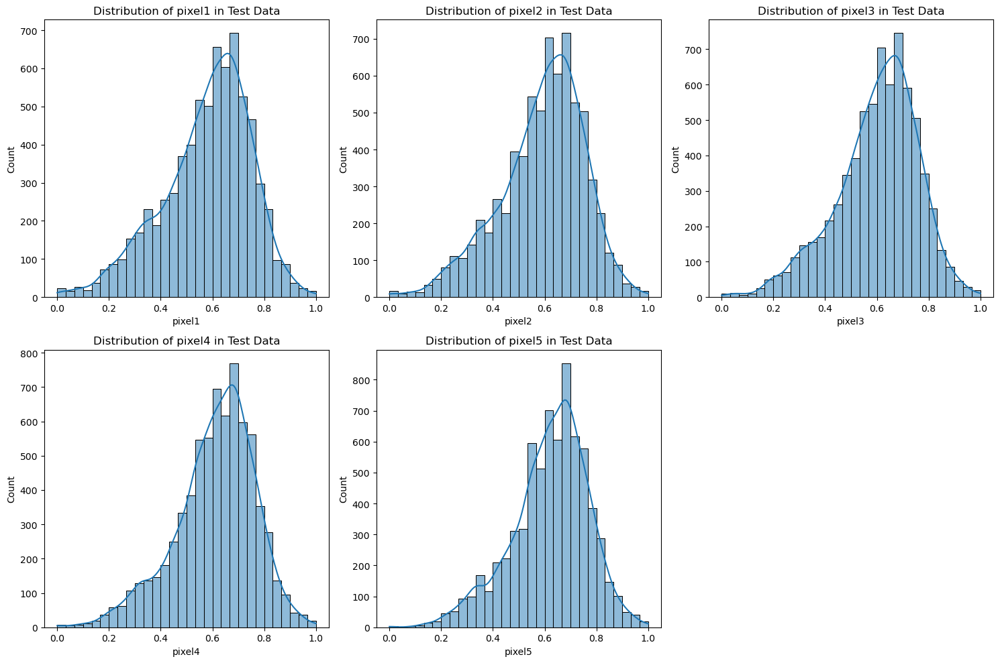

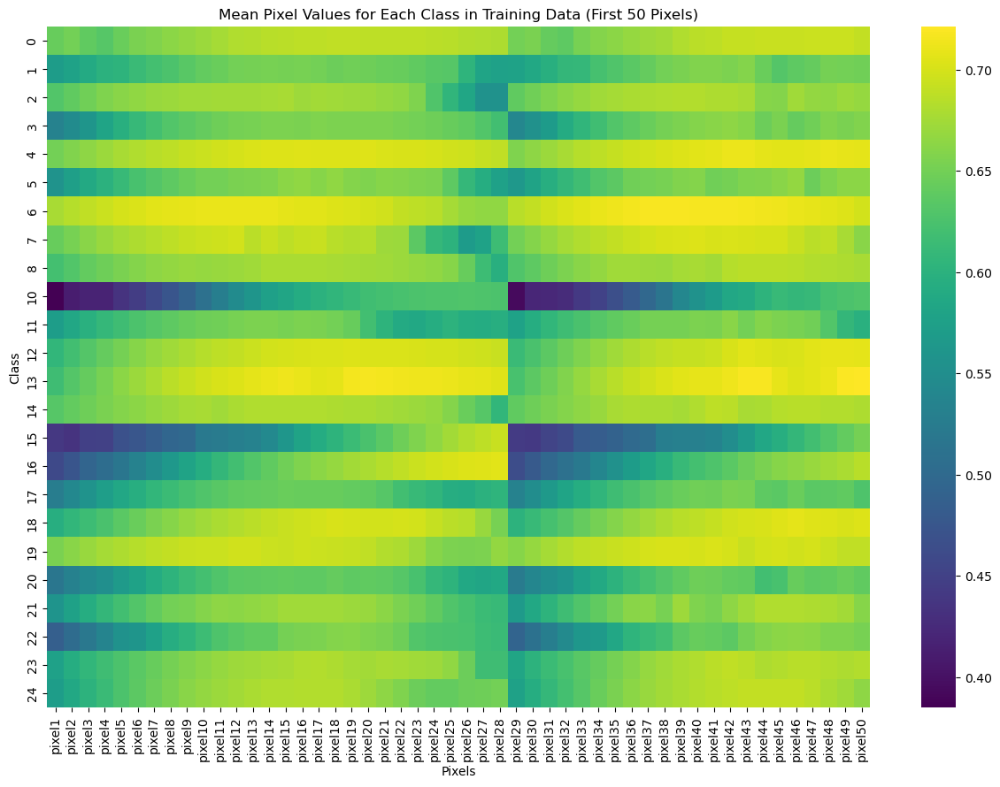

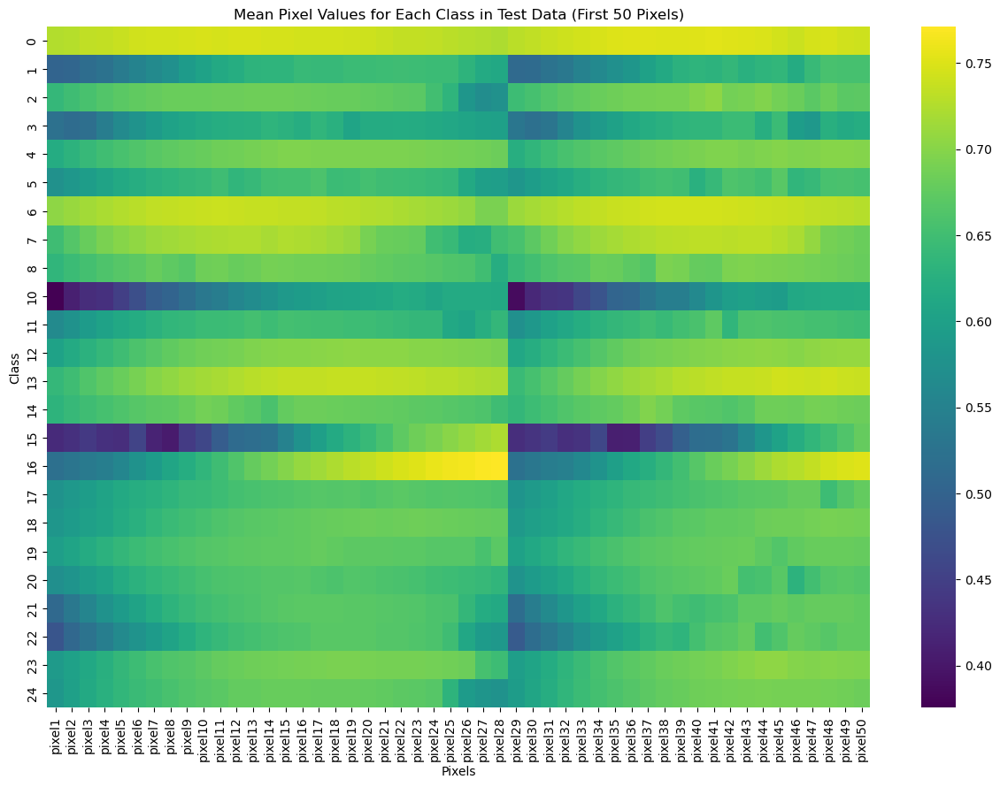

In [ ]:
# Plot histograms for the distribution of pixel values for a few selected pixels
selected_pixels = ['pixel1', 'pixel2', 'pixel3', 'pixel4', 'pixel5']

plt.figure(figsize=(15, 10))
for i, pixel in enumerate(selected_pixels, 1):
    plt.subplot(2, 3, i)
    sns.histplot(train_data[pixel], kde=True, bins=30)
    plt.title(f'Distribution of {pixel} in Training Data')
plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 10))
for i, pixel in enumerate(selected_pixels, 1):
    plt.subplot(2, 3, i)
    sns.histplot(test_data[pixel], kde=True, bins=30)
    plt.title(f'Distribution of {pixel} in Test Data')
plt.tight_layout()
plt.show()

# Calculate and plot the mean pixel values for each class
mean_pixel_values_train = train_data.groupby('label').mean()
mean_pixel_values_test = test_data.groupby('label').mean()

plt.figure(figsize=(15, 10))
sns.heatmap(mean_pixel_values_train.iloc[:, :50], cmap='viridis')
plt.title('Mean Pixel Values for Each Class in Training Data (First 50 Pixels)')
plt.xlabel('Pixels')
plt.ylabel('Class')
plt.show()

plt.figure(figsize=(15, 10))
sns.heatmap(mean_pixel_values_test.iloc[:, :50], cmap='viridis')
plt.title('Mean Pixel Values for Each Class in Test Data (First 50 Pixels)')
plt.xlabel('Pixels')
plt.ylabel('Class')
plt.show()

## Inferential Analysis

1. **Hypothesis 1: Relationship Between Pixel Intensity and Gesture Class**
    - **Null Hypothesis (H0):** There is no significant relationship between the intensity of individual pixels and the gesture class.
    - **Alternative Hypothesis (H1):** There is a significant relationship between the intensity of individual pixels and the gesture class.
    - **Analysis Method:** Perform a chi-square test of independence to determine if there is a significant association between pixel intensity and gesture class.

2. **Hypothesis 2: Difference in Mean Pixel Intensity Between Classes**
    - **Null Hypothesis (H0):** The mean pixel intensity for each pixel is the same across different gesture classes.
    - **Alternative Hypothesis (H1):** The mean pixel intensity for each pixel differs across different gesture classes.
    - **Analysis Method:** Conduct an ANOVA test to compare the mean pixel intensities across different gesture classes.

3. **Hypothesis 3: Correlation Between Pixels**
    - **Null Hypothesis (H0):** There is no significant correlation between the intensities of different pixels.
    - **Alternative Hypothesis (H1):** There is a significant correlation between the intensities of different pixels.
    - **Analysis Method:** Calculate the Pearson correlation coefficient for pairs of pixels and test for significance.
```

In [ ]:
from scipy.stats import chi2_contingency

# Select a subset of pixels for the chi-square test
selected_pixels_for_chi2 = ['pixel1', 'pixel2', 'pixel3', 'pixel4', 'pixel5']

# Create a contingency table for each selected pixel
chi2_results = {}
for pixel in selected_pixels_for_chi2:
    contingency_table = pd.crosstab(train_data['label'], train_data[pixel])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    chi2_results[pixel] = {'chi2': chi2, 'p-value': p, 'dof': dof}

# Display the results
chi2_results

{'pixel1': {'chi2': 15669.634541274077, 'p-value': 0.0, 'dof': 5842},
 'pixel2': {'chi2': 16860.490678492926, 'p-value': 0.0, 'dof': 5842},
 'pixel3': {'chi2': 16727.80376324161, 'p-value': 0.0, 'dof': 5819},
 'pixel4': {'chi2': 17845.737329170537, 'p-value': 0.0, 'dof': 5842},
 'pixel5': {'chi2': 16662.44974130278, 'p-value': 0.0, 'dof': 5842}}

In [ ]:
from scipy.stats import f_oneway

# Perform ANOVA test for selected pixels
anova_results = {}
for pixel in selected_pixels:
    groups = [train_data[train_data['label'] == label][pixel] for label in train_data['label'].unique()]
    f_stat, p_value = f_oneway(*groups)
    anova_results[pixel] = {'F-statistic': f_stat, 'p-value': p_value}

# Display the results
anova_results

{'pixel1': {'F-statistic': 297.85722853430525, 'p-value': 0.0},
 'pixel2': {'F-statistic': 299.54918331100913, 'p-value': 0.0},
 'pixel3': {'F-statistic': 290.1122616491583, 'p-value': 0.0},
 'pixel4': {'F-statistic': 297.9716348463923, 'p-value': 0.0},
 'pixel5': {'F-statistic': 288.9332561888259, 'p-value': 0.0}}

In [ ]:
from scipy.stats import pearsonr

# Calculate the Pearson correlation coefficient for pairs of selected pixels
correlation_results = {}
for i, pixel1 in enumerate(selected_pixels):
    for pixel2 in selected_pixels[i+1:]:
        corr, p_value = pearsonr(train_data[pixel1], train_data[pixel2])
        correlation_results[(pixel1, pixel2)] = {'correlation': corr, 'p-value': p_value}

# Display the results
correlation_results

{('pixel1', 'pixel2'): {'correlation': 0.9809251494409966, 'p-value': 0.0},
 ('pixel1', 'pixel3'): {'correlation': 0.9634786251510894, 'p-value': 0.0},
 ('pixel1', 'pixel4'): {'correlation': 0.9458561686151025, 'p-value': 0.0},
 ('pixel1', 'pixel5'): {'correlation': 0.9274142321701537, 'p-value': 0.0},
 ('pixel2', 'pixel3'): {'correlation': 0.9780057562956322, 'p-value': 0.0},
 ('pixel2', 'pixel4'): {'correlation': 0.9527409636285439, 'p-value': 0.0},
 ('pixel2', 'pixel5'): {'correlation': 0.9460088989595731, 'p-value': 0.0},
 ('pixel3', 'pixel4'): {'correlation': 0.9785566711892127, 'p-value': 0.0},
 ('pixel3', 'pixel5'): {'correlation': 0.9583168914940979, 'p-value': 0.0},
 ('pixel4', 'pixel5'): {'correlation': 0.9786029454836579, 'p-value': 0.0}}

## Modeling Analysis

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Prepare the data
X_train = train_data.drop('label', axis=1)
y_train = train_data['label']
X_test = test_data.drop('label', axis=1)
y_test = test_data['label']


### kNN

In [ ]:
# K-Nearest Neighbors
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)
knn_predictions = knn_model.predict(X_test)
knn_accuracy = accuracy_score(y_test, knn_predictions)
print(f'KNN Accuracy: {knn_accuracy}')
print(classification_report(y_test, knn_predictions))

KNN Accuracy: 0.8059118795315114
              precision    recall  f1-score   support

           0       0.79      1.00      0.88       331
           1       0.94      0.95      0.95       432
           2       0.94      1.00      0.97       310
           3       0.77      0.93      0.84       245
           4       0.81      0.96      0.88       498
           5       0.93      0.91      0.92       247
           6       0.91      0.94      0.92       348
           7       0.93      0.94      0.94       436
           8       0.86      0.66      0.75       288
          10       0.87      0.59      0.70       331
          11       0.94      0.89      0.91       209
          12       0.78      0.50      0.61       394
          13       0.76      0.58      0.66       291
          14       1.00      0.89      0.94       246
          15       1.00      1.00      1.00       347
          16       0.95      1.00      0.97       164
          17       0.30      0.60      0.40     

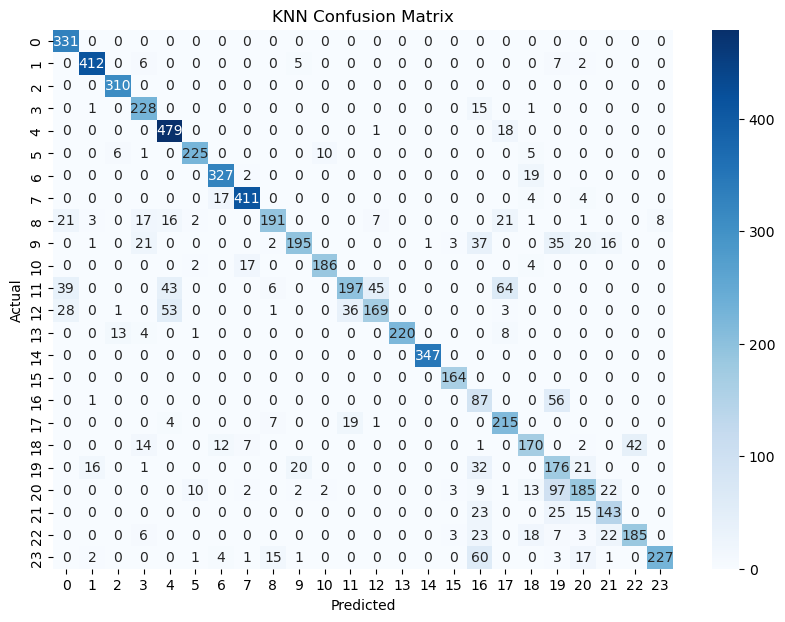

In [ ]:
# Confusion Matrix for KNN
plt.figure(figsize=(10, 7))
sns.heatmap(confusion_matrix(y_test, knn_predictions), annot=True, fmt='d', cmap='Blues')
plt.title('KNN Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### SVM

In [ ]:
# Support Vector Machine
svm_model = SVC(kernel='linear')
svm_model.fit(X_train, y_train)
svm_predictions = svm_model.predict(X_test)
svm_accuracy = accuracy_score(y_test, svm_predictions)
print(f'SVM Accuracy: {svm_accuracy}')
print(classification_report(y_test, svm_predictions))


SVM Accuracy: 0.7861126603457892
              precision    recall  f1-score   support

           0       0.86      1.00      0.93       331
           1       1.00      0.95      0.97       432
           2       0.78      0.98      0.87       310
           3       0.94      1.00      0.97       245
           4       0.94      1.00      0.97       498
           5       0.69      0.83      0.75       247
           6       0.84      0.86      0.85       348
           7       0.92      0.88      0.90       436
           8       0.70      0.74      0.72       288
          10       0.64      0.42      0.51       331
          11       0.66      0.64      0.65       209
          12       0.87      0.74      0.80       394
          13       0.87      0.64      0.74       291
          14       0.88      0.65      0.75       246
          15       0.90      1.00      0.95       347
          16       0.75      0.95      0.84       164
          17       0.30      0.69      0.42     

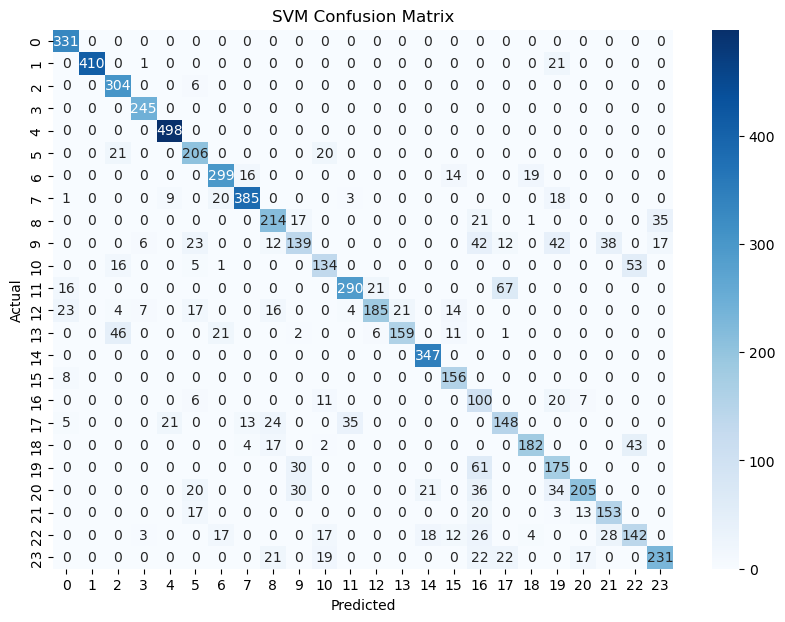

In [ ]:
# Confusion Matrix for SVM
plt.figure(figsize=(10, 7))
sns.heatmap(confusion_matrix(y_test, svm_predictions), annot=True, fmt='d', cmap='Blues')
plt.title('SVM Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [ ]:
# Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_predictions = rf_model.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_predictions)
print(f'Random Forest Accuracy: {rf_accuracy}')
print(classification_report(y_test, rf_predictions))

Random Forest Accuracy: 0.8163692136084774
              precision    recall  f1-score   support

           0       0.91      1.00      0.95       331
           1       0.98      0.93      0.95       432
           2       0.94      1.00      0.97       310
           3       0.83      0.98      0.90       245
           4       0.87      0.99      0.93       498
           5       0.93      0.91      0.92       247
           6       0.93      0.86      0.89       348
           7       0.99      0.94      0.96       436
           8       0.83      0.80      0.81       288
          10       0.72      0.64      0.68       331
          11       0.82      1.00      0.90       209
          12       0.88      0.71      0.78       394
          13       0.75      0.52      0.61       291
          14       0.99      0.88      0.93       246
          15       0.92      1.00      0.96       347
          16       0.91      0.99      0.95       164
          17       0.29      0.55     

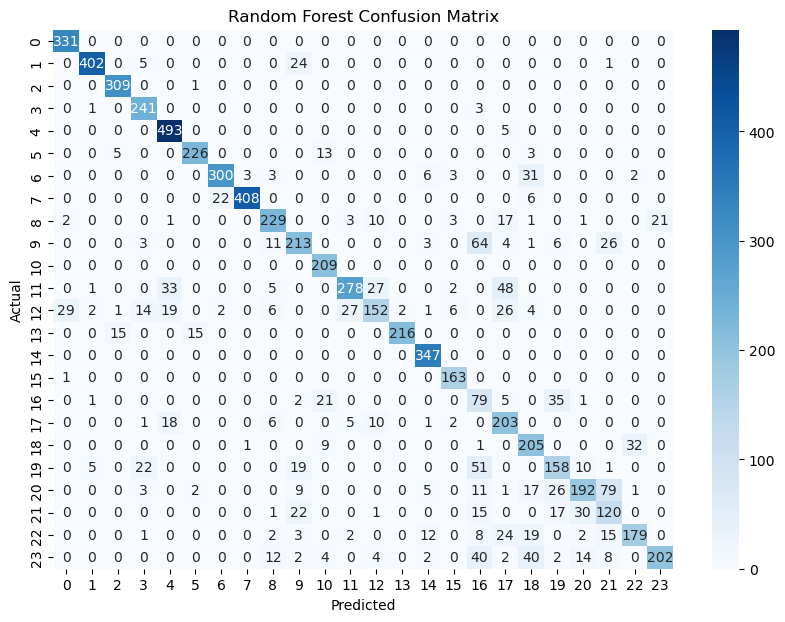

In [ ]:
# Confusion Matrix for Random Forest
plt.figure(figsize=(10, 7))
sns.heatmap(confusion_matrix(y_test, rf_predictions), annot=True, fmt='d', cmap='Blues')
plt.title('Random Forest Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### Best Model Evaluation

Based on the accuracy scores obtained from different models, we can determine the best model for classifying sign language gestures.

- **K-Nearest Neighbors (kNN) Accuracy:** 80.59%
- **Support Vector Machine (SVM) Accuracy:** 78.61%
- **Random Forest Accuracy:** 81.64%

From the models evaluated so far, the **Random Forest Classifier** has the highest accuracy of 81.64%, making it the best model among the ones tested.
```

## ANN, CNN Analysis

In [1]:
# Data Preprocessing and Verification Modules
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# Label Binarization (Improved Output Over Label Encoding)
from sklearn.preprocessing import LabelBinarizer

In [2]:
# Sequential Layer Architecture
from tensorflow.keras.models import Sequential

# Image Preprocessing Engine
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# CNN Layer States
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D
from tensorflow.keras.layers import Flatten, Dropout, BatchNormalization

# Gradient Optimizers
from tensorflow.keras.optimizers import RMSprop, Adam, Nadam

# Model Callbacks for Performance Improvement
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

In [3]:
# Image Toolkit for Computer Vision/Image Classification
import cv2

In [10]:
PATH_TO_TRAINING = "/sign_mnist_train.csv"
PATH_TO_TESTING = "/sign_mnist_test.csv"

dataset_training = pd.read_csv(PATH_TO_TRAINING)
dataset_testing = pd.read_csv(PATH_TO_TESTING)

In [11]:
dataset_training.head(3)

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,3,107,118,127,134,139,143,146,150,153,...,207,207,207,207,206,206,206,204,203,202
1,6,155,157,156,156,156,157,156,158,158,...,69,149,128,87,94,163,175,103,135,149
2,2,187,188,188,187,187,186,187,188,187,...,202,201,200,199,198,199,198,195,194,195


In [12]:
dataset_testing.head(3)

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,6,149,149,150,150,150,151,151,150,151,...,138,148,127,89,82,96,106,112,120,107
1,5,126,128,131,132,133,134,135,135,136,...,47,104,194,183,186,184,184,184,182,180
2,10,85,88,92,96,105,123,135,143,147,...,68,166,242,227,230,227,226,225,224,222


In [13]:
# Sign Language MNIST Configurations
# NOTE: No classes exist for letters `J` and `Z`.
NUM_CLASSES = 24

Text(0.5, 1.0, 'Number of classes (Sign Language MNIST)')

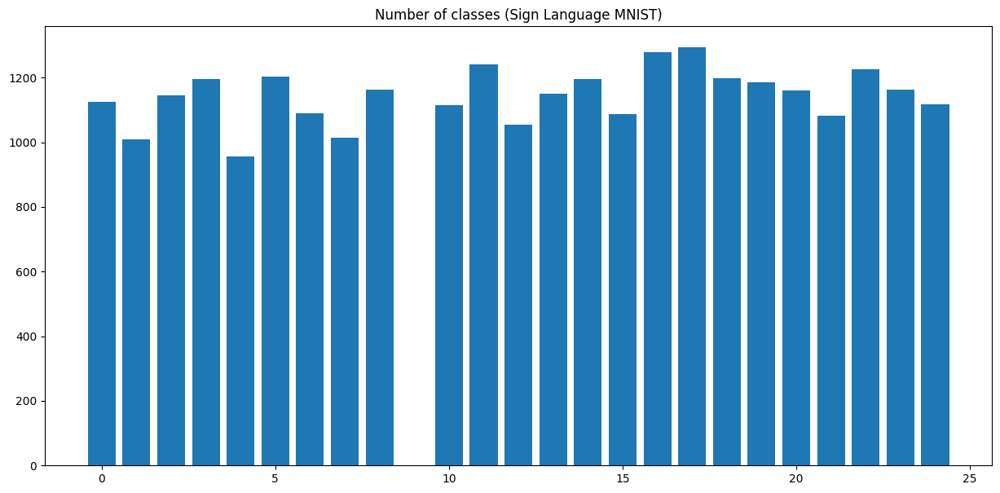

In [14]:
# Visualize distribution of assorted classes across training dataset
plt.figure(figsize=(15, 7))

class_frequencies = dict(map(
    lambda key, value: (key, value), *np.unique(dataset_training["label"], return_counts=True)
    ))

plt.bar(class_frequencies.keys(), class_frequencies.values())
plt.title("Number of classes (Sign Language MNIST)")

Text(0.5, 1.0, 'Number of classes (Sign Language MNIST)')

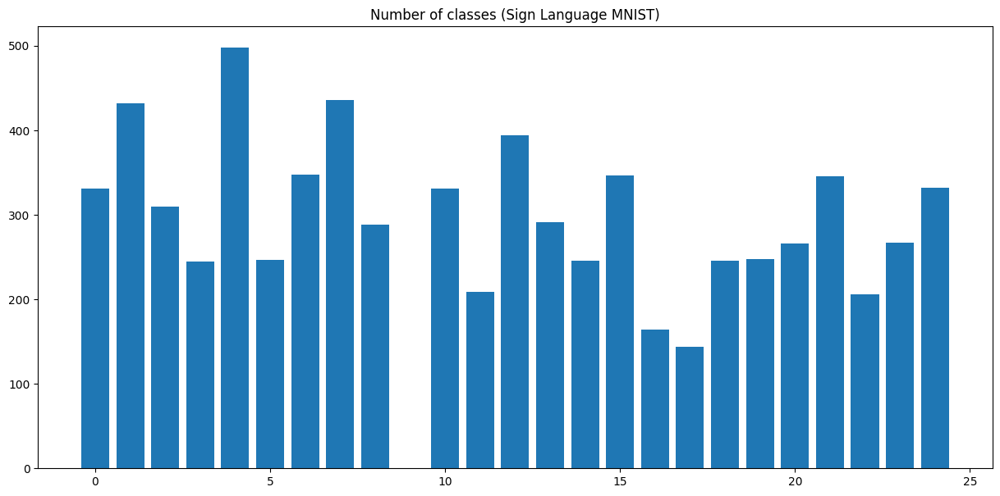

In [15]:
# Visualize distribution of assorted classes across testing dataset
plt.figure(figsize=(15, 7))

class_frequencies = dict(map(
    lambda key, value: (key, value), *np.unique(dataset_testing["label"], return_counts=True)
    ))

plt.bar(class_frequencies.keys(), class_frequencies.values())
plt.title("Number of classes (Sign Language MNIST)")

In [16]:
X_training = dataset_training.drop(columns=["label"]).values
X_testing = dataset_testing.drop(columns=["label"]).values

In [17]:
label_binarizer = LabelBinarizer()

y_training = label_binarizer.fit_transform(dataset_training["label"])
y_testing = label_binarizer.fit_transform(dataset_testing["label"])

In [18]:
# Image Normalization
X_training = X_training / 255.0
X_testing = X_testing / 255.0

In [19]:
# Image Reshaping
X_training = X_training.reshape(-1, 28, 28, 1)
X_testing = X_testing.reshape(-1, 28, 28, 1)

# Image Type Forcing
X_training = X_training.astype("float32"); X_testing = X_testing.astype("float32")

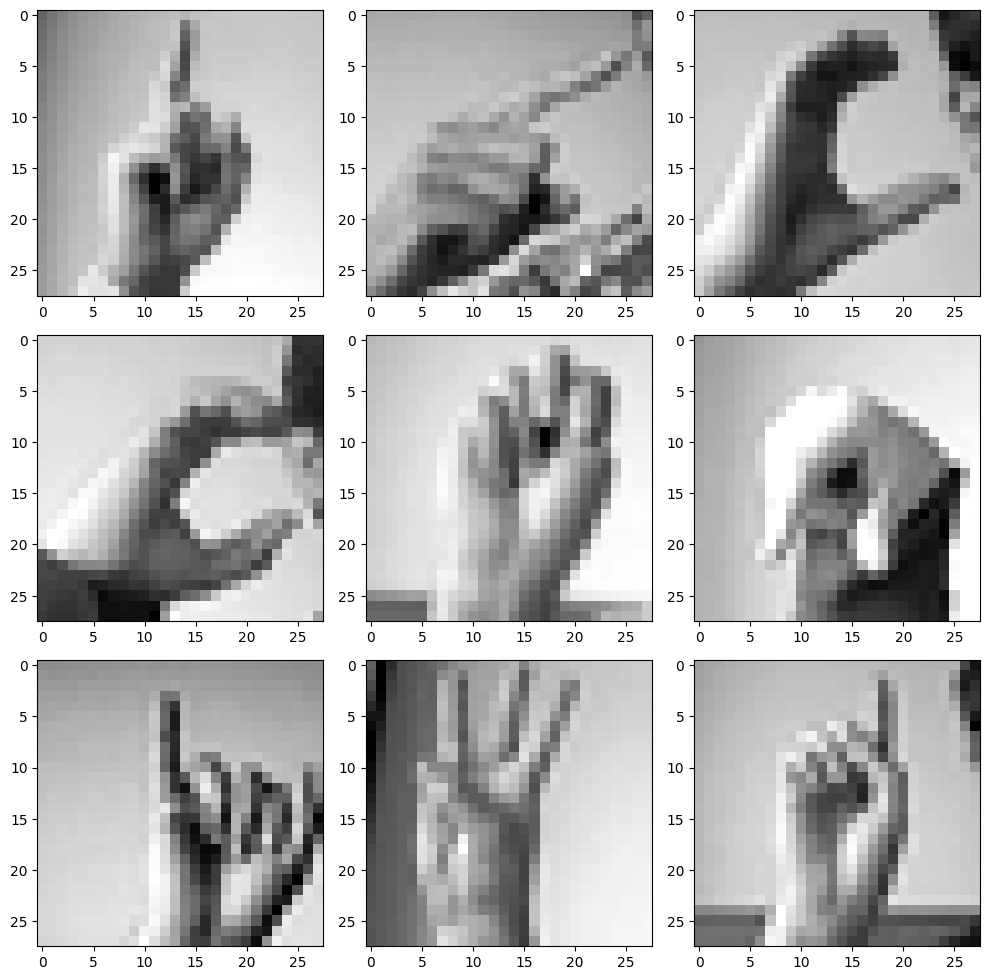

In [20]:
# Plot some sample images
NUM_ROWS, NUM_COLS = 3, 3
figure, axes = plt.subplots(NUM_ROWS, NUM_COLS)
figure.set_size_inches(10, 10)
selection = 0

for row in range(NUM_ROWS):
    for col in range(NUM_COLS):
        axes[row, col].imshow(X_training[selection].reshape(28, 28),
                              cmap="gray")
        selection += 1
    plt.tight_layout()

In [21]:
""" First attempt at CNN architecture. """

# Two convolutional layer steps to create feature mapping
convolutional_layer_1 =   Conv2D(filters=8,
                                 kernel_size=(5, 5),
                                 padding="Same",
                                 activation="relu",
                                 input_shape=(28, 28, 1))
convolutional_layer_2 =   Conv2D(filters=16,
                                 kernel_size=(3, 3),
                                 padding="Same",
                                 activation="relu")

# Two corresponding pooling layers to reduce convolved dimensionality
pooling_layer_1 =         MaxPool2D(pool_size=(2, 2))
pooling_layer_2 =         MaxPool2D(pool_size=(2, 2),
                                    strides=(2, 2))

# Three dropout layers: two for the convolutions and one for the ANN
dropout_layer_1 =         Dropout(0.25)
dropout_layer_2 =         Dropout(0.25)
dropout_layer_3 =         Dropout(0.5)

# A flattening layer for ingestion into the ANN
flattening_layer_1 =      Flatten()

# Two dense layers to make up the significant ANN architecture
connective_layer_1 =      Dense(256,
                                activation="relu")
output_layer =            Dense(24,
                                activation="softmax")

In [22]:
# Initialize sequential model schema
model = Sequential()

# Add first convolutional feature mapping process layers
model.add(convolutional_layer_1)
model.add(pooling_layer_1)
model.add(dropout_layer_1)

# Add second convolutional feature mapping process layers
model.add(convolutional_layer_2)
model.add(pooling_layer_2)
model.add(dropout_layer_2)

# Add image vectorization process layer
model.add(flattening_layer_1)

# Add connective ANN process layers
model.add(connective_layer_1)
model.add(dropout_layer_3)
model.add(output_layer)

# Summarize model layering setup
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 28, 28, 8)           │             208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 14, 14, 8)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 14, 14, 8)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 14, 14, 16)          │           1,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 7, 7, 16)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 7, 7, 16)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 784)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         200,960 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 24)                  │           6,168 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 208,504 (814.47 KB)

 Trainable params: 208,504 (814.47 KB)

 Non-trainable params: 0 (0.00 B)

In [23]:
# Define Adam optimization
optimizer = Adam(learning_rate=0.001)

In [24]:
# Set compilation properties
model.compile(optimizer=optimizer,
              loss="categorical_crossentropy",
              metrics=["accuracy"])

# Set epochs and batch size
epochs, batch_size = 20, 500

In [25]:
# Create image augmentation engine as generator-like object
generator = ImageDataGenerator(
    featurewise_center=False,
    samplewise_center=False,
    featurewise_std_normalization=False,
    samplewise_std_normalization=False,
    zca_whitening=False,
    rotation_range=5,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=False,
    vertical_flip=False,
)

# Fit training data to augmentation generator
generator.fit(X_training)

In [26]:
print("Independent training set size:\t\t{}".format(X_training.shape))
print("Independent validation set size:\t{}".format(X_testing.shape))
print("Target training set size:\t\t{}".format(y_training.shape))
print("Target validation set size:\t\t{}".format(y_testing.shape))

Independent training set size:		(27455, 28, 28, 1)
Independent validation set size:	(7172, 28, 28, 1)
Target training set size:		(27455, 24)
Target validation set size:		(7172, 24)


In [27]:
early_stoppage_executor = EarlyStopping(monitor="val_accuracy",
                                        patience=3,
                                        verbose=1)

learning_rate_moderator = ReduceLROnPlateau(monitor="val_accuracy",
                                            patience=3,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=0.00001)

In [28]:
# Fit model using generator-augmented dataset and mini-batch ingestion
history = model.fit(
    generator.flow(X_training,
                   y_training,
                   batch_size=batch_size),
    epochs=epochs,
    validation_data=(X_testing, y_testing),
    batch_size=batch_size,
    callbacks=[early_stoppage_executor,
               learning_rate_moderator]
)

Epoch 1/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 30s 468ms/step - accuracy: 0.0507 - loss: 3.1918 - val_accuracy: 0.1110 - val_loss: 3.1088 - learning_rate: 0.0010
Epoch 2/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 40s 461ms/step - accuracy: 0.1183 - loss: 3.0195 - val_accuracy: 0.3157 - val_loss: 2.5128 - learning_rate: 0.0010
Epoch 3/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 42s 490ms/step - accuracy: 0.2308 - loss: 2.5486 - val_accuracy: 0.4926 - val_loss: 1.8465 - learning_rate: 0.0010
Epoch 4/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 40s 466ms/step - accuracy: 0.3404 - loss: 2.1106 - val_accuracy: 0.6304 - val_loss: 1.3917 - learning_rate: 0.0010
Epoch 5/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 26s 454ms/step - accuracy: 0.4339 - loss: 1.8019 - val_accuracy: 0.6946 - val_loss: 1.1285 - learning_rate: 0.0010
Epoch 6/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 26s 459ms/step - accuracy: 0.4988 - loss: 1.5741 - val_accuracy: 0.7702 - val_loss: 0.9032 - learning_rate: 0.0010
Epoch 7/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 41s 458ms/step - accuracy: 0.5500 - loss: 1.

In [30]:
def plot_training_results(history):
    """
    Visualize results of the model training using `matplotlib`.

    The visualization will include charts for accuracy and loss,
    on the training and as well as validation data sets.

    INPUTS:
        history(tf.keras.callbacks.History):
            Contains data on how the model metrics changed
            over the course of training.

    OUTPUTS:
        None.
    """
    # Get accuracy for training and validation sets
    accuracy = history.history['accuracy']
    validation_accuracy = history.history['val_accuracy']

    # Get loss for training and validation sets
    loss = history.history['loss']
    validation_loss = history.history['val_loss']

    # Get range of epochs to produce common plotting range
    epochs_range = range(epochs)

    # Instantiate plotting figure space
    plt.figure(figsize=(20, 8))

    # Create training/validation accuracy subplot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, accuracy, label='Training Accuracy')
    plt.plot(epochs_range, validation_accuracy, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    # Create training/validation loss subplot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, validation_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')

    # Render visualization
    plt.show()

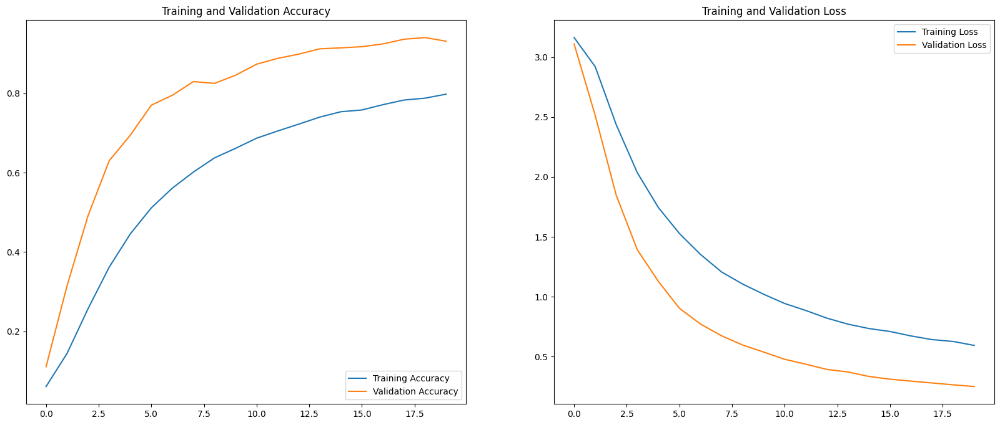

In [31]:
# Visualize accuracy and loss for training and validation datasets
plot_training_results(history)

225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step


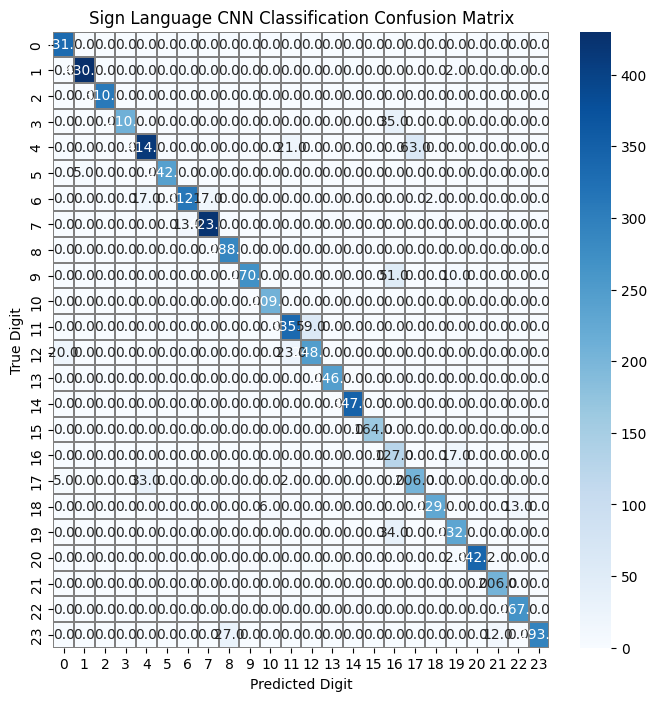

In [32]:
# Get predicted class values from fitted model
y_predicted = model.predict(X_testing)

# Get class distributions for predicted and true class values
y_pred_classes =  np.argmax(y_predicted, axis=1)
y_true =          np.argmax(y_testing, axis=1)

# Create confusion matrix object from class distributions
cmat = confusion_matrix(y_true, y_pred_classes)

# Render confusion matrix as heatmap visualization
figure, axis = plt.subplots(figsize=(8, 8))
sns.heatmap(cmat,
            annot=True,
            linewidths=0.01,
            cmap="Blues",
            linecolor="gray",
            fmt=".1f",
            ax=axis)
plt.xlabel("Predicted Digit")
plt.ylabel("True Digit")
plt.title("Sign Language CNN Classification Confusion Matrix")
plt.show()

In [33]:
def load_image_as_object(path_to_img):
    sample_img = cv2.imread(path_to_img, cv2.IMREAD_GRAYSCALE)
    sample_img = cv2.resize(sample_img, (28, 28))
    sample_img_arr = np.asarray(sample_img) / 255.0
    return sample_img_arr.reshape(1, 28, 28, 1)

In [34]:
def render_image_grid(img_arrs, num_rows=2, num_cols=2):
    """ NOTE: Only works for four images at a time currently. """
    figure, axes = plt.subplots(num_rows, num_cols)
    figure.set_size_inches(10, 10)
    selection = 0
    for row in range(num_rows):
        for col in range(num_cols):
            axes[row, col].imshow(img_arrs[selection].reshape(28, 28),
                                  cmap="gray")
            selection += 1
        plt.tight_layout()
    plt.show()

In [35]:
def get_model_prediction_for_loaded_image(model, img_obj):
    class_probabilities = model.predict(img_obj)
    # J and Z do not exist, so prediction must be corrected for that.
    class_probabilities = np.insert(class_probabilities, 9, 0)
    class_probabilities = np.insert(class_probabilities, 25, 0)
    # Convert highest probability for optimal class prediction.
    predicted_class = np.argmax(class_probabilities)
    return predicted_class

In [51]:
TESTING_IMAGE_PATHS = ["/ASL-S.jpg", "/ASL-U.jpg", "/ASL-E.jpg"]

In [52]:
sample_images = []

for path_to_img in TESTING_IMAGE_PATHS:
    sample_images.append(load_image_as_object(path_to_img=path_to_img))

IndexError: list index out of range

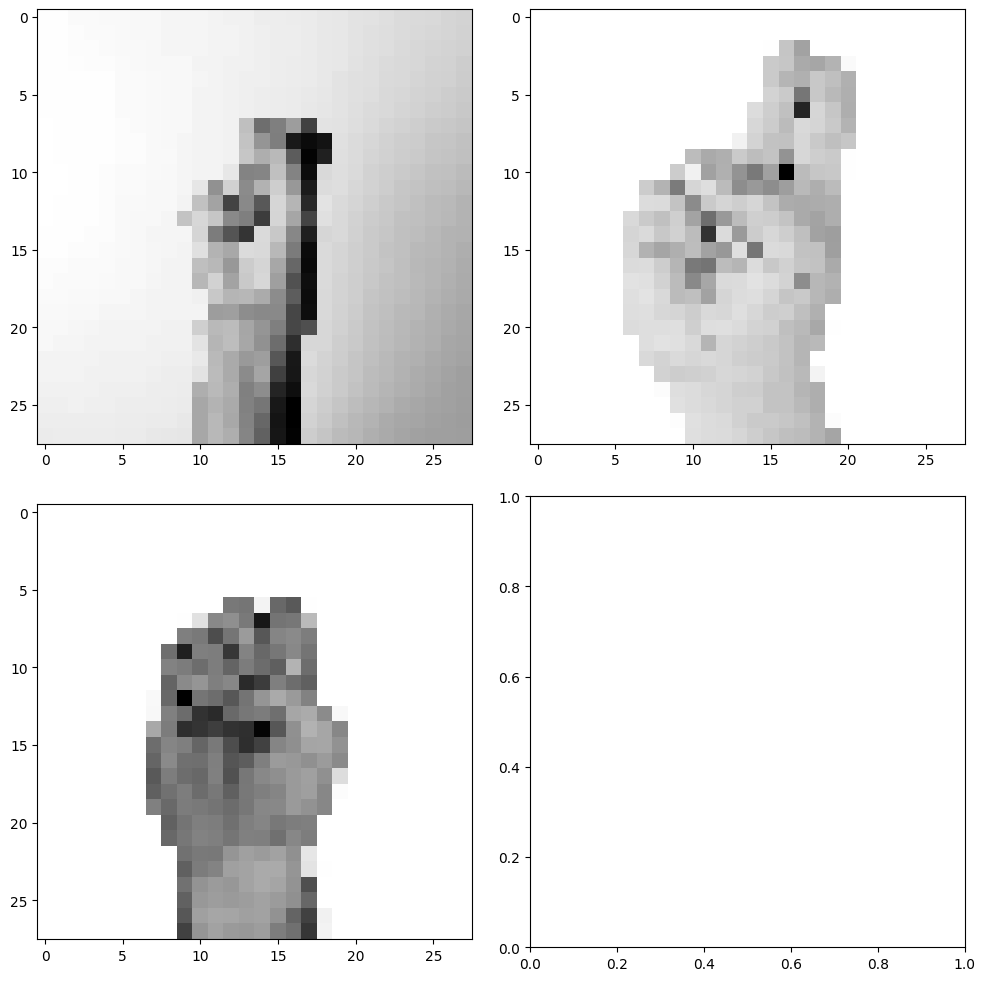

In [53]:
render_image_grid(sample_images)

In [54]:
predicted_indices = []
for sample_image in sample_images:
    predicted_indices.append(get_model_prediction_for_loaded_image(model=model,
                                                                   img_obj=sample_image))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


In [56]:
resultant_string = ""

for index in predicted_indices:
    resultant_string += chr((index - 1) + 97)

print(f">> TRUE STRING: \t`sue`")
print(f">> PREDICTED STRING: \t`{resultant_string}`")

>> TRUE STRING: 	`sue`
>> PREDICTED STRING: 	`rmn`


In [57]:
model.save("jeesoos_subpar_model_112124.h5")